In [1]:
import scenic
from scenic.syntax.veneer import localPath
from scenic.core.regions import MeshVolumeRegion
from rulebook_benchmark.realization import Realization
import random
from scenic.simulators.metadrive import MetaDriveSimulator
from rulebook_benchmark.process_trajectory import process_trajectory, process_trajectory_old
import shapely
import matplotx
import shapely.plotting
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib import rc

from rulebook_benchmark.rule_functions import (
    f1,
    f2,
    f3,
    f4,
    f5,
    f6,
    f7,
    f8,
    f9,
    f11_a,
    f11_b,
    f12_a,
    f12_b,
    f13_a,
    f13_b,
    f15,
    f17,
    f18,

)

from reasonable_crowd.parse_trajectory import parse_trajectory
from reasonable_crowd.parse_map import parse_map



/Users/ekin/Scenic/src/scenic/core/errors.py:271: UserWarning: unable to install sys.excepthook to format Scenic backtraces
  warnings.warn("unable to install sys.excepthook to format Scenic backtraces")
INFO:numexpr.utils:Note: NumExpr detected 10 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


Only need to do this part once

In [2]:
network_U = parse_map('/Users/ekin/downloads/reasonable_crowd_data/maps', 'U')
network_S = parse_map('/Users/ekin/downloads/reasonable_crowd_data/maps', 'S')

You do this for each trajectory

In [3]:
realization = parse_trajectory('/Users/ekin/downloads/reasonable_crowd_data/trajectories/U_2-a.json', step_size=100000)
realization.network = network_U
process_trajectory(realization)

In [4]:
from shapely.plotting import plot_polygon, plot_line
from scenic.core.vectors import Vector

In [5]:


def create_gif(frame, ax1, ax2, results, realization, MAX_STEPS, keys=None):
    ax1.clear()
    ax2.clear()
    ego = realization.get_ego()
    network = realization.network



    drivable_region = network.drivableRegion
    #walkable_region = network.walkableRegion

    if keys is None:
        keys = results.keys()

    for key in keys:
        result = results[key]
        ax2.plot(range(frame+1), result.violation_history[:frame+1], label=key)
        #label should be displayed next to the line
    frame = frame
    
    ego_state = ego.get_state(frame)
    
    
    ego_region = ego_state.polygon
    ego_center = shapely.Point(ego_state.position[0], ego_state.position[1])
    
    shapely.plotting.plot_points([ego_center], ax=ax1, color='black', markersize=2)
    if ego_state.lane is not None:
        ego_lane = ego_state.lane.polygon
        shapely.plotting.plot_polygon(ego_lane, ax=ax1, add_points=False)

    
    
    shapely.plotting.plot_polygon(ego_region, ax=ax1, add_points=False, color='red')    
    
    
    for adv in realization.objects_non_ego:
        
        adv_state = adv.get_state(frame)        
        adv_region = adv_state.polygon
        adv_center = shapely.Point(adv_state.position[0], adv_state.position[1])
        if adv.object_type == 'Pedestrian':
            color = 'purple'
        else:
            color = 'blue'
        if adv_state.lane is not None:
            adv_lane = adv_state.lane.polygon
            shapely.plotting.plot_polygon(adv_lane, ax=ax1, add_points=False, color='green')
        shapely.plotting.plot_polygon(adv_region, ax=ax1, add_points=False, color=color)
        shapely.plotting.plot_points([adv_center], ax=ax1, color='black', markersize=2)
    
    shapely.plotting.plot_polygon(drivable_region.polygons, ax=ax1, add_points=False)
    intersection_region = network.intersectionAt(ego_state.position)
    if intersection_region is not None:
        roads = intersection_region.roads
        for road in roads:
            shapely.plotting.plot_polygon(road.polygon, ax=ax1, add_points=False, color='orange')
    ax1.set_xticks([])
    ax1.set_yticks([])



    
    #delete frame around plot
    for spine in ax1.spines.values():
        spine.set_visible(False)
    #center plot around ego
    ax1.set_xlim(ego_state.position[0]-50, ego_state.position[0]+50)
    ax1.set_ylim(ego_state.position[1]-50, ego_state.position[1]+50)
    ax1.set_title(f"Step {frame}", loc='left', fontsize=10, color='black')
    ax2.set_xlim(0, MAX_STEPS)
    ax2.set_xticks([0, MAX_STEPS])
    ax2.set_ylim(0, 10)
    
    
    ax2.set_yticks([0, 10])
    #shrink legend to fit plot
    
    matplotx.line_labels(ax2)

    ax2.set_title("Violation History", fontsize=10, color='black')

In [6]:

def get_rule_violations(realization):
    results = {}

    results['vru_collision'] = f1(realization)
    results['vehicle_collision'] = f2(realization)
    results['drivable_area'] = f3(realization)
    results['vru_ttc'] = f4(realization)
    results['vru_acknowledgement'] = f5(realization)
    results['vehicle_ttc'] = f6(realization)
    results['correct_side'] = f7(realization)
    results['vru_offroad'] = f8(realization)
    results['vru_onroad'] = f9(realization)
    results['front_clearance_buffer'] = f11_a(realization)
    results['left_clearance_buffer'] = f12_a(realization)
    results['right_clearance_buffer'] = f13_a(realization)
    results['speed_limit'] = f15(realization)
    results['lane_keeping'] = f17(realization)
    results['lane_centering'] = f18(realization)
    
    return results

vru_keys = ['vru_collision', 'vru_onroad', 'vru_offroad', 'drivable_area', 'vru_ttc', 'correct_side', 'vru_acknowledgement',  'speed_limit', 'lane_keeping', 'lane_centering']
vehicle_keys = ['vehicle_collision', 'drivable_area', 'vehicle_ttc', 'correct_side', 'front_clearance_traj', 'front_clearance_buffer', 'left_clearance_traj', 'left_clearance_buffer', 'right_clearance_traj', 'right_clearance_buffer', 'speed_limit', 'lane_keeping', 'lane_centering']



def create_realization_gif(realization, keys=None):
    results = get_rule_violations(realization)
    #ceiling = max([results[key].total_violation for key in keys])
    # labels do not fit in the plot, make it wider
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    anim = animation.FuncAnimation(fig, lambda frame: create_gif(frame, ax1, ax2, results, realization, len(realization), keys), frames=len(realization), repeat=False, interval=60)
    plt.close(fig)
    rc('animation', html='jshtml')
    return HTML(anim.to_jshtml())

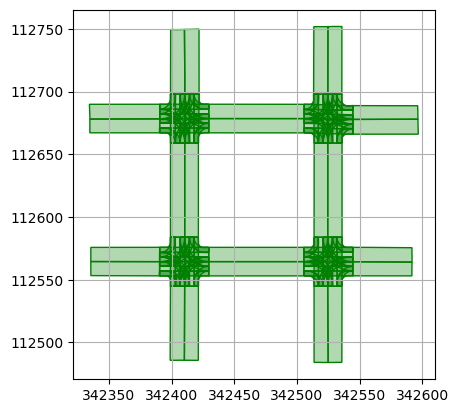

In [11]:
for lane in network_U.laneGroups:
    plot_polygon(lane.polygon, add_points=False, color='green')

In [8]:
create_realization_gif(realization)

/opt/anaconda3/envs/benchmark/lib/python3.8/site-packages/shapely/measurement.py:72: RuntimeWarning: overflow encountered in distance
  return lib.distance(a, b, **kwargs)
INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


<Figure size 640x480 with 0 Axes>

In [2]:
lane = network.lanes[28]


plot_line(lane.centerline.lineString, color='red', add_points=False)
plot_line(lane.leftEdge.lineString, color='blue', add_points=False)
plot_line(lane.rightEdge.lineString, color='green', add_points=False)

centerline_point = lane.centerline.lineString.coords[50]

orientation = lane.orientation.value(Vector(centerline_point[0], centerline_point[1])).yaw

#plot the orientation vector with an arrow
import matplotlib.pyplot as plt
import numpy as np
plt.arrow(centerline_point[0], centerline_point[1], 10 * np.cos(orientation), 10 * np.sin(orientation), head_width=1, head_length=2, fc='k', ec='k')

NameError: name 'network' is not defined

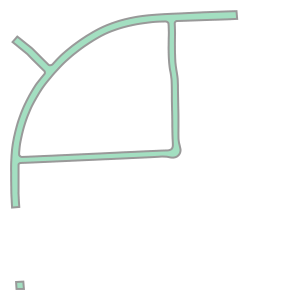

In [ ]:
network.drivableRegion.polygons

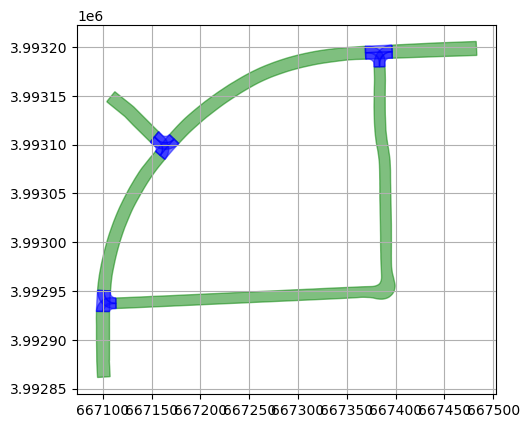

In [ ]:
for road in network.roads:
    plot_polygon(road.polygon, color='green', alpha=0.5, add_points=False)
for road in network.connectingRoads:
    plot_polygon(road.polygon, color='blue', alpha=0.5, add_points=False)

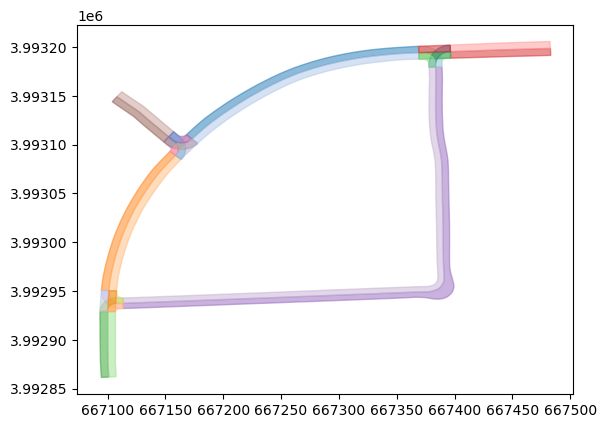

In [ ]:
# plot a different color for each lane group

import matplotlib.pyplot as plt

fig, ax = plt.subplots()
for i, lane in enumerate(network.laneGroups):
    color = plt.cm.tab20(i % 20)  # Use a colormap for distinct colors
    plot_polygon(lane.polygon, ax=ax, color=color, add_points=False, alpha=0.5)
plt.show()